<a href="https://colab.research.google.com/github/BimaBayuUWUUU/PCVK_Ganjil_2023/blob/main/Kuis2_Kel1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Anggota Kelompok 1 :**

1. 2141720185 - Adam Rafi Rezandi
2. 2141720003 - Tio Misbaqul Irawan
3. 2141720019 - Bima Bayu Saputra
4. 2141720036 - Lailatul Badriyah
5. 2141720046 - Andi Dwi Prastyo


---
# **Kuis 2 Praktikum**
---

1. Mengerjakan secara kelompok yang terdiri dari 5 anggota
2. Kumpulkan e-ktp anggota keluarga atau kelas pada kelompok minimal 5 buah sebagai dataset. 1 foto bisa berbagai pose ketika pengambilan foto e-ktp.
4. Deteksi dan kenali foto wajah e-ktp tersebut menggunakan metode yang telah dipelajari baik pada matakulilah PCVK ataupun matakuliah lain pada semester ini.
3. Presentasikan di depan kelas hasil dari pekerjaan kelompok Anda, paparkan hasil dari pekerjaan tersebut secara detail lengkap dengan tangkapan layar bagian dari; (1)pre-processing, (2)lokalisasi, (3)segmentasi, dan (4)pengenalan.
5. Jangan lupa upload juga kode program tersebut pada repository
6. Kumpulkan link file presentasi dalam bentuk pdf dan link repository.

---
## **Import Data**
---

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Import Library
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
import os

---
## **Preprocessing**
---

In [16]:
# Direktori tempat gambar-gambar berada
directories = '/content/drive/MyDrive/PCVK/P7/KTP'

# Load HaarCascade untuk deteksi
cascade_wajah = cv2.CascadeClassifier('/content/drive/MyDrive/PCVK/P12/haarcascades/haarcascade_frontalface_alt.xml')

---
## **Deteksi Wajah**
---

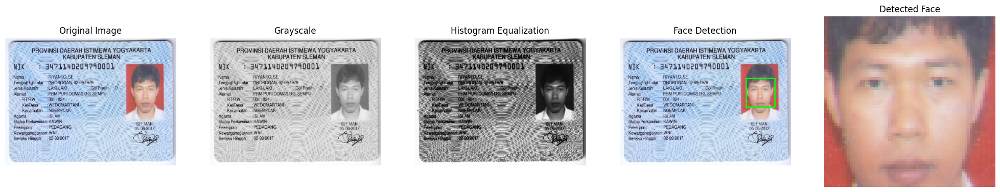

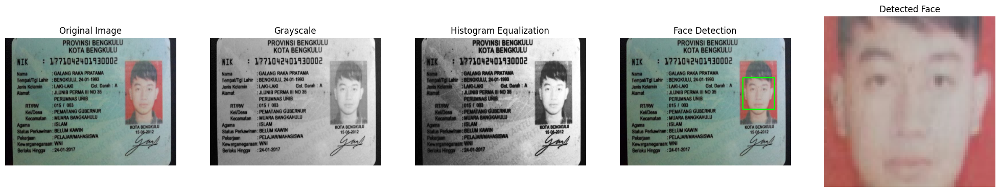

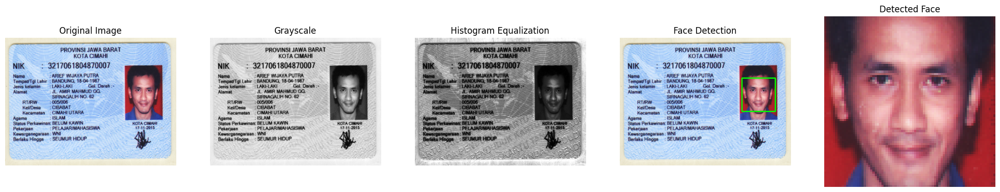

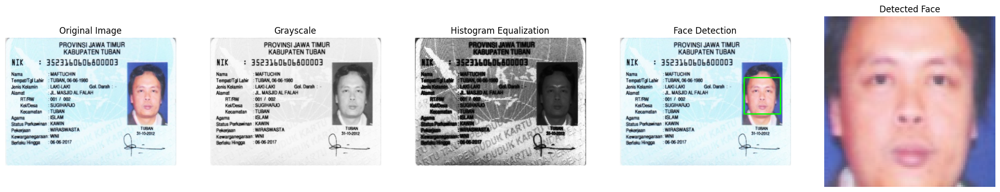

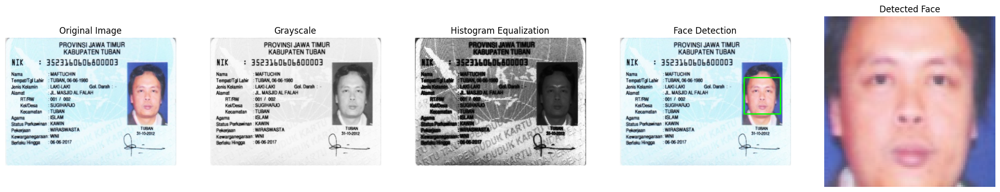

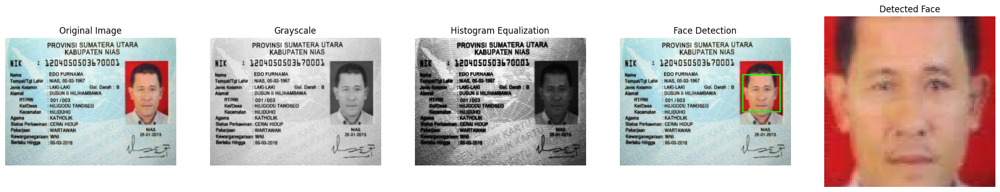

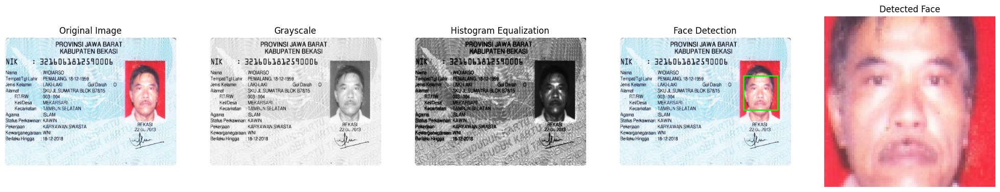

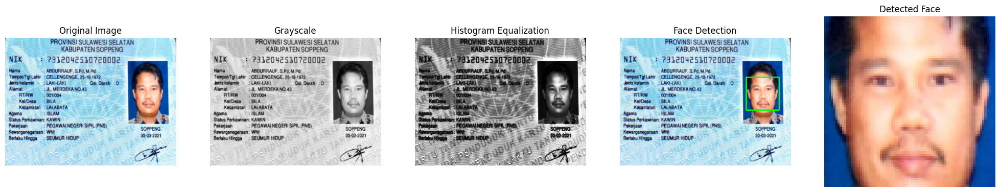

In [105]:
# Mendapatkan daftar file dalam direktori
files = os.listdir(directories)

# Loop melalui semua gambar dalam direktori
for i, img_file in enumerate(files, start=1):
    img_path = os.path.join(directories, img_file)
    img = cv2.imread(img_path)

    # PREPROCESSING
    # (1) Resize the image
    img = cv2.resize(img, (400, 300))

    # (2) Convert to Grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # (3) Histogram Equalization
    equalized_img = cv2.equalizeHist(gray_img)

    # (4) Lokalisasi (Face Detection)
    faces = cascade_wajah.detectMultiScale(img, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

    # SEGEMENTASI DAN RECOGNIZATION
    for (x, y, w, h) in faces:
        # (5) Segmentasi (Crop Wajah)
        face_segment = img[y:y+h, x:x+w]

        # Tampilkan hasil segmentasi dan pengenalan wajah
        plt.figure(figsize=(25, 6))

        # Gambar asli
        plt.subplot(151)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.axis('off')

        # Grayscale image (PREPROCESSING)
        plt.subplot(152)
        plt.imshow(gray_img, cmap='gray')
        plt.title('Grayscale')
        plt.axis('off')

        # Equalized Image (PREPROCESSING)
        plt.subplot(153)
        plt.imshow(equalized_img, cmap='gray')
        plt.title('Histogram Equalization')
        plt.axis('off')

        # Gambar dengan kotak di sekitar wajah (Lokalisasi - Face Detection)
        img_with_boxes = img.copy()
        cv2.rectangle(img_with_boxes, (x, y), (x+w, y+h), (0, 255, 0), 2)
        plt.subplot(154)
        plt.imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB))
        plt.title('Face Detection')
        plt.axis('off')

        # Gambar Segmentasi Wajah
        plt.subplot(155)
        plt.imshow(cv2.cvtColor(face_segment, cv2.COLOR_BGR2RGB))
        plt.title('Detected Face')
        plt.axis('off')

        plt.show()

---
## **Deteksi Objek Karakter**
---

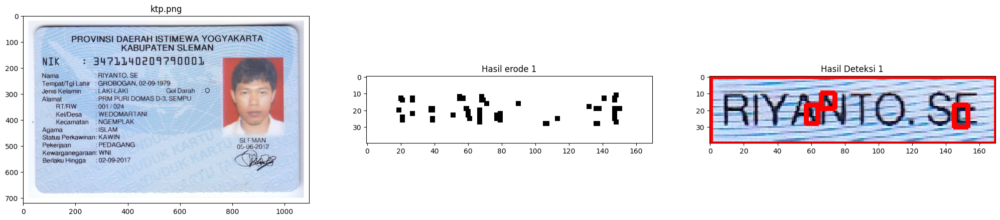

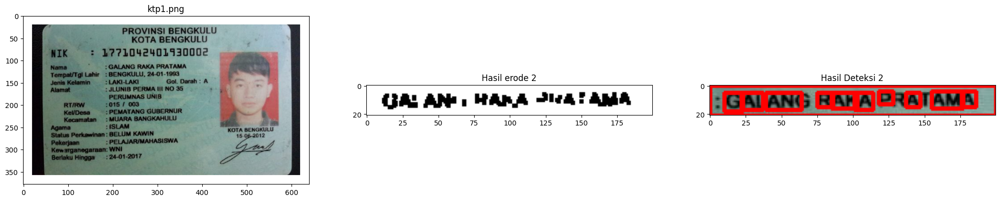

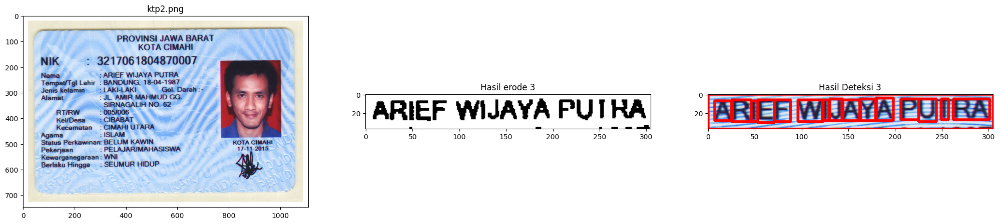

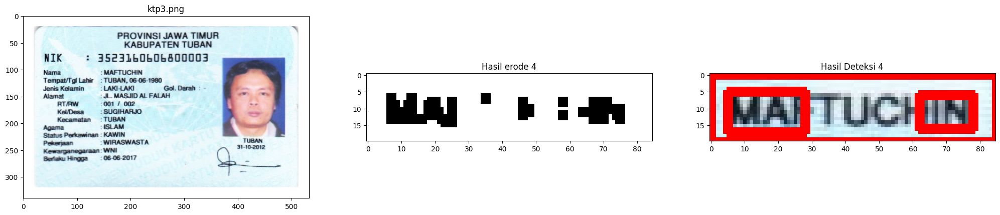

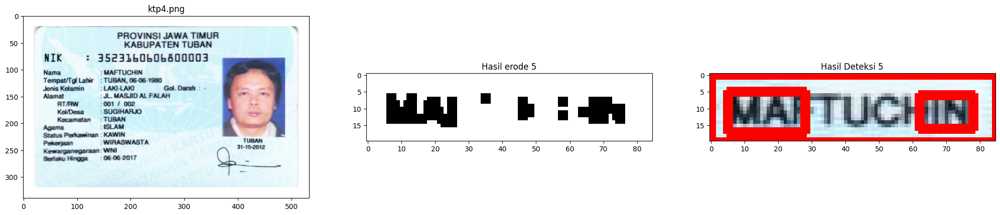

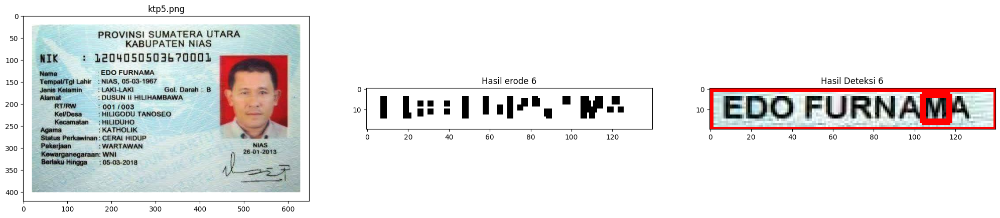

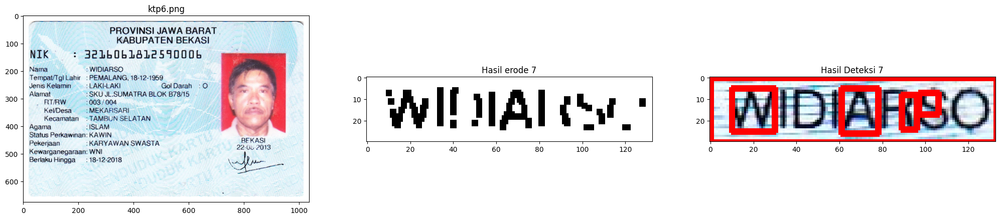

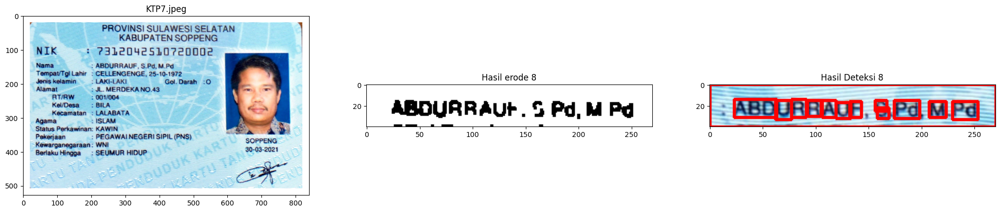

In [107]:
# Direktori tempat gambar-gambar berada
folder_path = '/content/drive/MyDrive/PCVK/P7/KTP'

# Membuat daftar path untuk semua file gambar dalam folder
image_paths = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

def process_image(image_path):
    # Membaca citra KTP dari path tertentu
    ktp = cv2.imread(image_path)

    # Menambahkan border putih sebesar 20 piksel di sekeliling citra KTP
    ktp = cv2.copyMakeBorder(
        src=ktp,
        top=20,
        bottom=20,
        left=20,
        right=20,
        borderType=cv2.BORDER_CONSTANT,
        value=(255, 255, 255)  # Nilai warna putih dalam format RGB
    )

    # Variabel-variabel untuk menentukan koordinat crop
    if "KTP7.jpeg" in image_path:
        crop_coords = (125, 165, 190, 460)
    elif "ktp.png" in image_path:
        crop_coords = (210, 250, 280, 450)
    elif "ktp1.png" in image_path:
        crop_coords = (104, 125, 180, 380)
    elif "ktp2.png" in image_path:
        crop_coords = (215, 252, 305, 610)
    elif "ktp3.png" in image_path:
        crop_coords = (95, 115, 145, 230)
    elif "ktp4.png" in image_path:
        crop_coords = (95, 115, 145, 230)
    elif "ktp5.png" in image_path:
        crop_coords = (120, 140, 170, 310)
    elif "ktp6.png" in image_path:
        crop_coords = (180, 210, 232, 365)
    else:
        # Tambahkan kondisi lain jika diperlukan
        crop_coords = (125, 165, 190, 460)

    # Melakukan operasi cropping
    ktp_crop = ktp[crop_coords[0]:crop_coords[1], crop_coords[2]:crop_coords[3]].copy()

    # Konversi citra KTP ke dalam citra keabuan (grayscale)
    ktp_gray = cv2.cvtColor(ktp_crop, cv2.COLOR_BGR2GRAY)

    # Melakukan operasi Gaussian Blur pada citra keabuan KTP
    ktp_blur = cv2.GaussianBlur(ktp_gray, (5, 5), 0.5)

    clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(5, 5))  # Membuat objek CLAHE
    gray = clahe.apply(ktp_blur)  # Mengaplikasikan CLAHE pada citra hasil crop

    # Melakukan thresholding pada citra untuk menghasilkan citra biner
    ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Memperjelas hasil thresholding menggunakan operasi morfologi closing
    kernel = np.ones((3, 3), np.uint8)
    closing = cv2.morphologyEx(bw, cv2.MORPH_CLOSE, kernel, iterations=1)
    dilate = closing.copy()  # Salinan hasil closing

    # Ekstraksi kontur dari citra hasil operasi closing
    contours, hierarchy = cv2.findContours(dilate.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

    # Looping kontur untuk mendeteksi objek berdasarkan kriteria ukuran dan rasio aspek
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        ras = format(w / h, '.2f')

        # Deteksi berdasarkan ukuran dan rasio aspek tertentu, lalu membuat bounding box pada objek yang sesuai
        if h >= 40 and w >= 10 and float(ras) <= 1:
            cv2.rectangle(ktp_crop, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
        elif h >= 8 and w >= 8 and float(ras) <= 10:
            cv2.rectangle(ktp_crop, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
        elif h >= 10 and w >= 7 and float(ras) <= 8:
            cv2.rectangle(ktp_crop, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)

    return ktp, dilate, ktp_crop

# Menampilkan hasil untuk setiap citra
for i, image_path in enumerate(image_paths, start=1):
    ktp, dilate, output = process_image(image_path)

    # Menampilkan citra hasil crop, hasil operasi morfologi, dan hasil deteksi objek dengan bounding box
    f, axarr = plt.subplots(1, 3, figsize=(25, 8))
    axarr[0].imshow(cv2.cvtColor(ktp, cv2.COLOR_BGR2RGB))
    axarr[0].set_title(os.path.basename(image_path))
    axarr[1].imshow(dilate, cmap='gray')
    axarr[1].set_title(f"Hasil erode {i}")
    axarr[2].imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
    axarr[2].set_title(f"Hasil Deteksi {i}")
    plt.show()